### EDA

In [2]:
import pandas as pd 
# import datatable as dt
# import geopandas as gpd
import numpy as np
import gc
import re

#plotting
import matplotlib.pyplot as plt 
import seaborn as sns

#map
import folium 


#preprocessing 
from sklearn.base import TransformerMixin
from sklearn.pipeline import Pipeline

Dataset Description

1)business.json  : Contains business data including location data, attributes, and categories.

2)review.json   : Contains full review text data including the user_id that wrote the review and the business_id the review is written for.

In [ ]:

# Load data
rowlimit = 1000000
review = pd.read_json('/Users/mandidisha/Downloads/SDMmandi/Yelp/yelp_academic_dataset_review.json', 
                      lines=True,
                       orient='columns',
                       chunksize=100000)

business = pd.read_json('/Users/mandidisha/Downloads/SDMmandi/Yelp/yelp_academic_dataset_business.json', 
                        lines=True)



business.head()


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


Column	Description

business_id --	A unique alphanumeric identifier for each business. Acts as the primary key to join with other tables like reviews.

name --	The name of the business (e.g., “Target”, “The UPS Store”).

address -- The street address of the business, sometimes includes suite or building numbers.

city --	The city where the business is located.

state -- The abbreviated US state or Canadian province where the business operates (e.g., CA, AZ, PA).

postal_code -- The ZIP or postal code of the business’s location.

latitude --	Geographical latitude coordinate of the business (used for mapping or distance calculations).

longitude --	Geographical longitude coordinate of the business.

stars --	The average star rating (out of 5) based on customer reviews.

review_count --	The total number of reviews that the business has received.

is_open --	A binary indicator: 1 if the business is currently open, 0 if it is permanently closed.

attributes --	A nested dictionary of additional metadata about the business, such as: BusinessAcceptsCreditCards, WiFi, OutdoorSeating, etc. Can be useful for feature engineering.

categories --	A comma-separated string listing the categories this business falls under (e.g., "Restaurants, Coffee & Tea, Food").

hours --	A dictionary containing the opening and closing hours per weekday. Keys are days (Monday, Tuesday, etc.), and values are time ranges (e.g., 7:00-20:00). If None, hours are not provided.

### 1) Business Data

 The objective of this section is to Filter Businesses that are not restaurants , and then extract and one hot encode the restaurant features and categories. 

In [4]:
business['restaurant']= (business.categories.str.contains(pat='Restaurant',
                                                          flags=re.IGNORECASE,
                                                          regex=True))


Subsetting data to include data with restaurants and that are open

In [5]:
required_columns = ['business_id','name','stars','categories','review_count','attributes']  # columns to use 

#saving restaurants  as csv 
restaurants = business[(business.restaurant==1) & (business.is_open==1)].reset_index(drop=True)

#keeping required cols 
restaurants=restaurants.loc[:,required_columns]


restaurant_list = restaurants.business_id.unique()   # list of restaurants ids 

print(f'{len(restaurants)} Restaurants(That are Open) in the Dataset')

35004 Restaurants(That are Open) in the Dataset


One hot Encode Categories

One hot Encode other attributes in Attribute Field


In [6]:
import pandas as pd
import numpy as np
from sklearn.base import TransformerMixin, BaseEstimator
import ast

class CategoryOHE(BaseEstimator, TransformerMixin):
    '''One-hot encode multi-category string columns'''
    
    def __init__(self, category_columns='categories', split=','):
        self.category_columns = category_columns
        self.split = split
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        df = X.copy(deep=True)
        category_columns = self.category_columns
        
        if isinstance(category_columns, list):
            for col in category_columns:
                encoded = df[col].fillna('').str.get_dummies(self.split)
                df = pd.concat([df, encoded], axis=1)
        else:
            encoded = df[category_columns].fillna('').str.get_dummies(self.split)
            df = pd.concat([df, encoded], axis=1)
        
        df.drop(category_columns, axis=1, inplace=True)
        return df

class ExtractAttributes(BaseEstimator, TransformerMixin):
    '''Extract and one-hot encode nested attribute dictionaries in Yelp data'''
    
    def __init__(self, attributes_list=['Ambience', 'GoodForMeal', 'DietaryRestrictions', 'Music']):
        self.attributes_list = attributes_list
        
    def fit(self, X, y=None):
        return self
    
    def _extract_keys(self, attr, key):
        if isinstance(attr, dict) and key in attr:
            return attr.pop(key)
        return "{}"
    
    def _str_to_dict(self, attr):
        try:
            return ast.literal_eval(attr) if attr else {}
        except (ValueError, SyntaxError):
            return {}
    
    def transform(self, X):
        df = X.copy(deep=True)
        
        # Convert 'attributes' column strings to dictionaries
        df['attributes'] = df['attributes'].apply(self._str_to_dict)

        # Extract nested keys
        for attrib in self.attributes_list:
            df[attrib] = df['attributes'].apply(lambda x: self._str_to_dict(self._extract_keys(x, attrib)))

        # One-hot encode extracted dictionaries
        ls = []
        for attrib in self.attributes_list:
            if attrib in df and df[attrib].notna().any():
                expanded = df[attrib].apply(pd.Series)
                if expanded is not None and not expanded.empty:
                    ls.append(expanded)

        # If there is no valid attribute data, skip the concat
        if ls:
            df_attr = pd.concat(ls, axis=1)
            df_attr_dummies = pd.get_dummies(df_attr)
            df = pd.concat([df, df_attr_dummies], axis=1)

        # Drop original nested attributes
        drop_cols = [col for col in self.attributes_list if col in df.columns]
        drop_cols.append('attributes')
        df.drop(columns=drop_cols, inplace=True, errors='ignore')
        
        return df


In [7]:
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('attribute_extractor', ExtractAttributes()),
    ('category_encoder', CategoryOHE()),
])

# Assume `restaurants` is your cleaned Yelp business dataset
restaurants_encoded = pipeline.fit_transform(restaurants)


In [8]:
print(f'Shape of the Transformed Dataset is {restaurants_encoded.shape}')

restaurants_encoded.to_csv('/Users/mandidisha/Downloads/SDMmandi/Yelp/restaurants.csv',index=False)

Shape of the Transformed Dataset is (35004, 1066)


### Where are our Restaurants located ??

In [9]:
import folium
from folium.plugins import HeatMap, MarkerCluster

# Create the base map
m1 = folium.Map(location=(37, -95),
                max_zoom=12, min_zoom=4, zoom_start=6,
                tiles='OpenStreetMap')  # Correct tile name

# Filter locations where restaurant == 1
locations = business.loc[business['restaurant'] == 1, ['latitude', 'longitude']]

# Create marker cluster
cluster = MarkerCluster().add_to(m1)

# Add each location to the cluster
for row in locations.itertuples(index=False):
    folium.Marker(location=[row.latitude, row.longitude]).add_to(cluster)

# Display the map
m1


/var/folders/xg/mpltyh650032sb9t_sqz_0_00000gn/T/ipykernel_68696/160357703.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="stars",


Text(0.5, 1.0, 'Distribution of Restaurant Ratings')

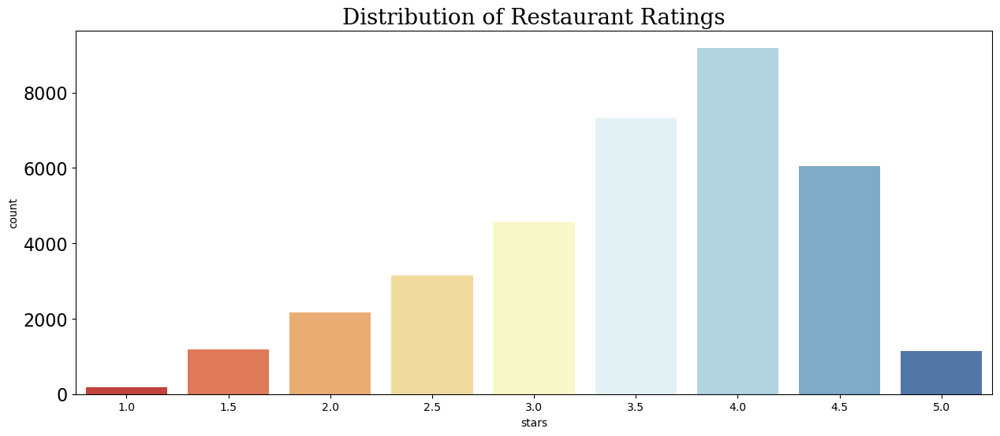

In [10]:
#distribution of stars 
fig,ax= plt.subplots(figsize=(15,6))
plt.yticks(fontsize=16)


sns.countplot(x="stars",
              data=restaurants,
              palette="RdYlBu",
              linewidth=3)

plt.title("Distribution of Restaurant Ratings",
          font="Serif",
          size=20,color='k')



2) User Reviews

In this section, we will filter user reviews to keep only the restaurant reviews. As the size of the dataset is large, we will load it in chunks to avoid out of memory errors.

In [11]:
#taking these columns for reviews 
required_columns2 = ['user_id','business_id','useful','stars','funny','cool','year_over_base']



review_dict = {'id_cols': ['user_id','business_id'],
               'review_cols': ['stars','useful','funny','cool']
              }

In [12]:
def to_datetime(df,
                datetime_column,
                frmt=None):
    '''convert a column to datetime object'''
    df[datetime_column] = pd.to_datetime(df[datetime_column],
                                         format= frmt)
    
    return None
    
def get_year(df,
             datetime_column='date',
             base_year=2004):
    '''get years passed over the base year column in dataset'''
    
    _ = to_datetime(df,datetime_column)
    
    
    # recentness of review
    df['year_over_base'] = df[datetime_column].dt.year - base_year
    
    return None

In [13]:
restaurant_reviews = []
review_count = 0 
total_reviews = 0

# as we are only concerned with restaurants, we will take only those reviews
for chunk_df in review:
    total_reviews += chunk_df.shape[0]

    # take only those rows which business ids are present in the restaurant list
    restaurants = chunk_df[chunk_df['business_id'].isin(restaurant_list)].reset_index(drop=True)
    review_count += len(restaurants)

    # get the year of review (as difference over base year == 2004)
    _ = get_year(restaurants)  # make sure this function modifies in place or returns modified DataFrame

    # append to the list
    restaurant_reviews.append(restaurants[required_columns2])

# now concatenate all chunks
restaurant_reviews = pd.concat(restaurant_reviews, ignore_index=True)

print(f'There are total {total_reviews} reviews (including restaurant reviews)')
print(f'There are total {review_count} Restaurant reviews in the dataset')

assert review_count == restaurant_reviews.shape[0], 'Hello Darkness my old (only) Friend'


There are total 6990280 reviews (including restaurant reviews)
There are total 3773971 Restaurant reviews in the dataset


In [14]:
print(f'There are {restaurant_reviews.user_id.nunique()} unique Users in the restaurant reviews dataset')
print(f'There are {restaurant_reviews.business_id.nunique()} unique Restaurants in the restaurant reviews dataset')

There are 1277330 unique Users in the restaurant reviews dataset
There are 35004 unique Restaurants in the restaurant reviews dataset


In [15]:
print(f'% of Restaurants with reviews :  {round((restaurant_reviews.business_id.nunique()/len(restaurant_list))* 100 )}')

% of Restaurants with reviews :  100


In [16]:
#saving user ids for future use 
restaurant_review_user_list = restaurant_reviews.user_id.unique()

/var/folders/xg/mpltyh650032sb9t_sqz_0_00000gn/T/ipykernel_68696/973644624.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="stars",


Text(0.5, 1.0, 'Distribution of Restaurant Review Ratings')

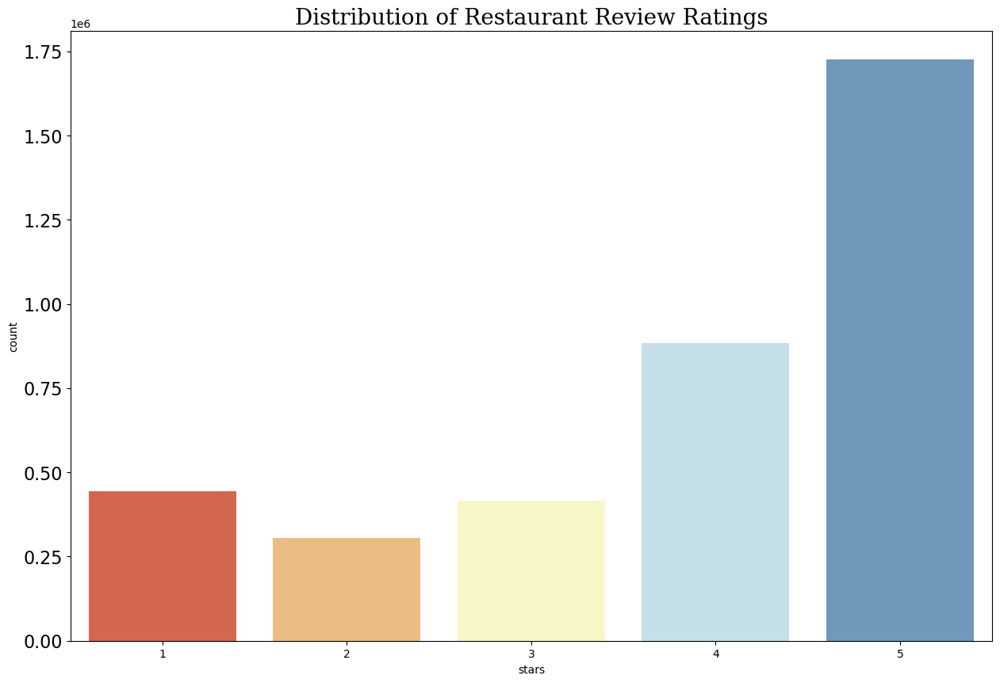

In [17]:
fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)


sns.countplot(x="stars",
              data=restaurant_reviews,
              palette="RdYlBu",
              linewidth=3)

plt.title("Distribution of Restaurant Review Ratings",
          font="Serif",
          size=20,color='k')


## Insight:
The distribution is skewed toward higher ratings.

5-star reviews are by far the most common, indicating generally positive experiences

1-star reviews are also notable, possibly due to polarizing experiences (either love or hate).

Ratings of 2 and 3 are less frequent.


/var/folders/xg/mpltyh650032sb9t_sqz_0_00000gn/T/ipykernel_68696/2671869306.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=years,


Text(0.5, 1.0, 'Count of reviews per year')

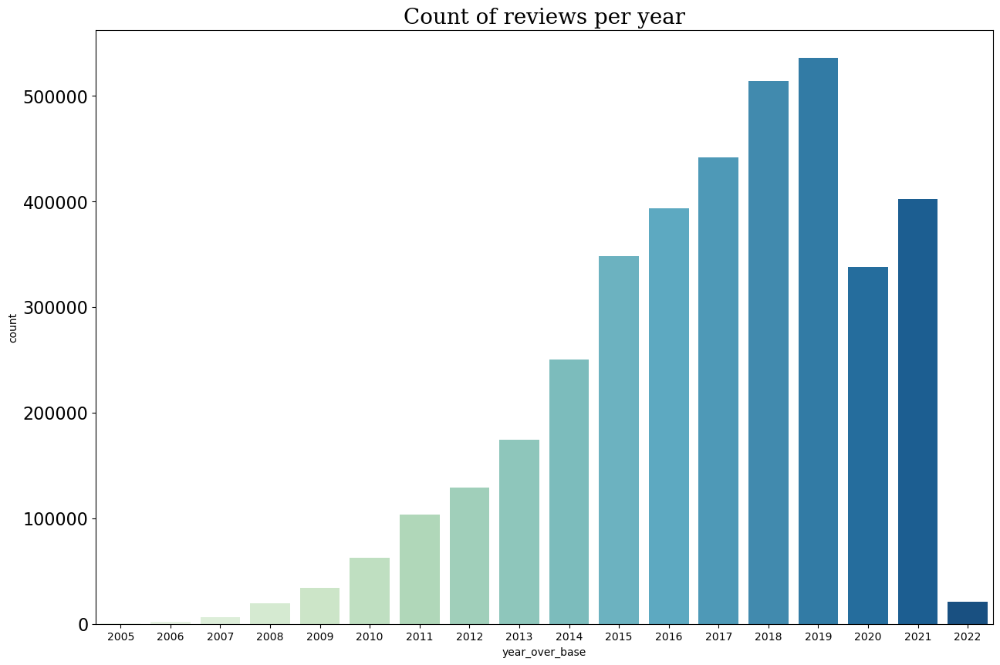

In [18]:
fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)

years = restaurant_reviews.year_over_base + 2004

sns.countplot(x=years,
              palette="GnBu",
              linewidth=3)

plt.title("Count of reviews per year",
          font="Serif",
          size=20,color='k')


## Insights: Count of Reviews per Year
1. Growth Phase (2005–2019)

From 2005 to 2019, there is a clear and consistent increase in the number of Yelp reviews.

This indicates growing platform adoption and user engagement over time.

The peak occurs in 2019, with over 540,000 reviews, reflecting the platform's highest activity level before external disruptions.

2. COVID-19 Impact (2020–2021)

There is a significant drop in review counts in 2020, aligning with the global COVID-19 pandemic.

This likely reflects widespread business closures, reduced customer traffic, and limited in-person experiences.

A partial recovery is visible in 2021, though review counts remain below the 2019 peak.

3. 2022 Decline (Possible Data Limitation)

The number of reviews in 2022 appears significantly lower than previous years.

This may be due to incomplete data for the year, depending on when the dataset was last updated.

It's important to treat the 2022 data point cautiously and not draw firm conclusions from it.

4. Long-Term Trend

The data demonstrates a typical technology adoption curve: slow initial growth (2005–2010), rapid scaling (2011–2019), and disruption due to a major external event (2020).

These insights can be useful when modeling user behavior over time or developing time-aware recommendation systems.

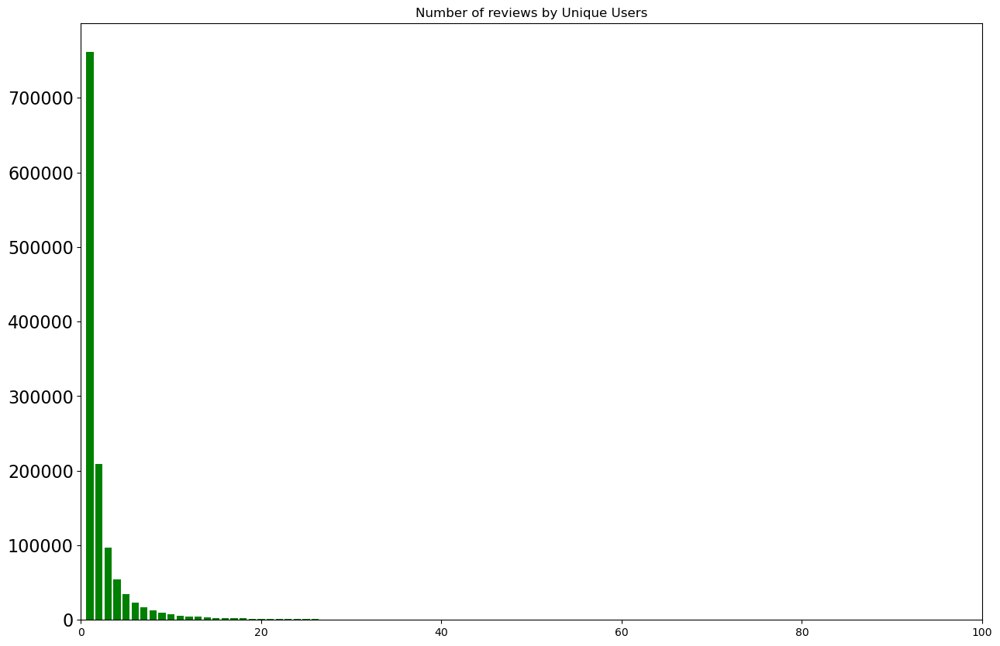

In [19]:
rating_count_count = restaurant_reviews.user_id.value_counts().value_counts()  # forgive me for this ;-

fig,ax= plt.subplots(figsize=(15,10))
plt.yticks(fontsize=16)


plt.bar(x=rating_count_count.index,height=rating_count_count,
        color='g')
plt.xlim((0,100))  # as the reviews beyond 100 are very few, clipping the values till 100
plt.title('Number of reviews by Unique Users')
plt.show()

In [23]:
duplicates = restaurant_reviews.duplicated()
print(f'Duplicates found: {duplicates.sum()}')
restaurant_reviews = restaurant_reviews[~duplicates]


Duplicates found: 16595


In [24]:
print(restaurant_reviews['stars'].value_counts())


stars
5    1715152
4     880715
1     441612
3     415028
2     304869
Name: count, dtype: int64


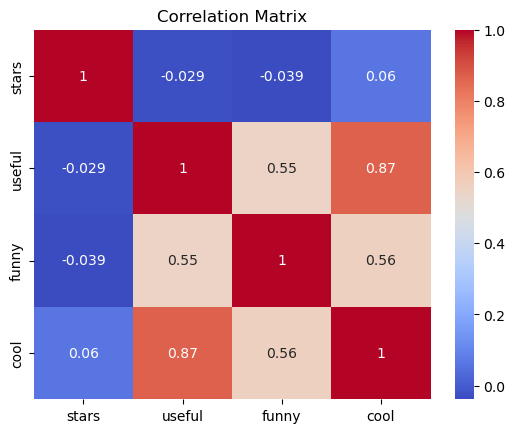

In [25]:
corr_matrix = restaurant_reviews[['stars', 'useful', 'funny', 'cool']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


## Insights: Correlation Matrix (stars, useful, funny, cool)
1. Correlation between stars and other features

The correlation between stars and the other variables is very weak.

stars vs. useful: -0.029

stars vs. funny: -0.039

stars vs. cool: 0.06

This suggests that the number of stars given in a review does not strongly correlate with how useful, funny, or cool others found that review.

2. Strong correlation between useful and cool

There is a high positive correlation between useful and cool (0.87).

This indicates that reviews marked as useful are also often marked as cool.

These metrics likely overlap in how users perceive the helpfulness and quality of a review.

3. Moderate correlation between funny and the others

funny vs. useful: 0.55

funny vs. cool: 0.56

These values show a moderate positive relationship.

Funny reviews are often seen as useful and cool, but not as strongly as the useful–cool connection.

4. Overall pattern

User reactions (useful, funny, cool) tend to correlate with each other,

while the actual star rating stands relatively independent of those social feedback metrics.



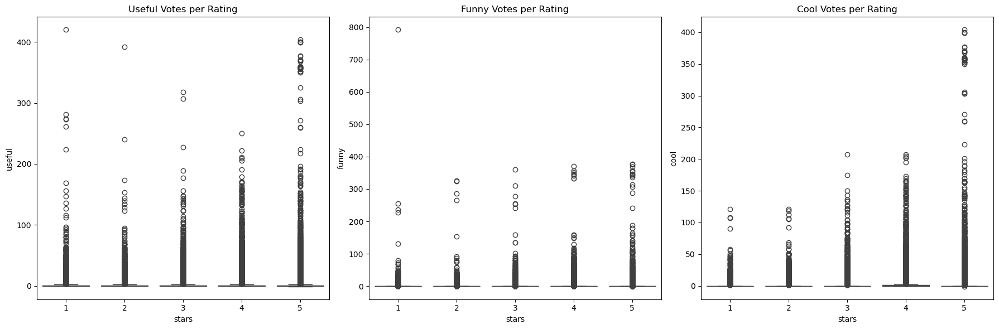

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for i, col in enumerate(['useful', 'funny', 'cool']):
    sns.boxplot(x='stars', y=col, data=restaurant_reviews, ax=axs[i])
    axs[i].set_title(f'{col.capitalize()} Votes per Rating')

plt.tight_layout()
plt.show()


## Insights: Distribution of Votes (useful, funny, cool) per Star Rating
1. Useful Votes per Rating

Across all star ratings (1–5), most reviews receive a low number of useful votes.

However, there is a noticeable increase in both the median and the maximum number of useful votes as ratings increase.

5-star reviews have the widest spread and highest outliers, with some reviews receiving over 400 useful votes.

This suggests that highly positive reviews may be more valued or more detailed, thus marked useful by other users.

2. Funny Votes per Rating

The overall distribution is similar to useful votes, but funniness is less consistent across ratings.

All star categories have reviews with zero funny votes, but there are extreme outliers even at low ratings (e.g., 1-star reviews marked as very funny).

This indicates that even negative reviews can be perceived as humorous, likely due to sarcasm or rant-like tone.

3. Cool Votes per Rating

Like the useful metric, cool votes increase with star rating, especially from 3 to 5 stars.

5-star reviews again dominate in terms of vote volume and outliers, suggesting that standout, positive reviews often get tagged as cool.

1 and 2-star reviews rarely receive high cool votes, with a much tighter distribution.

4. General Pattern

While useful, funny, and cool all have skewed distributions with many zeros,

the upper ranges (outliers) show that some reviews can gain significant social attention.

Positive reviews (4 and 5 stars) are more likely to accumulate higher social vote counts across all three metrics.

In [20]:
#saving restaurant reviews as a csv 

restaurant_reviews.to_csv('/Users/mandidisha/Downloads/SDMmandi/Yelp/restaurant_reviews.csv',
                          index=False)


In [21]:
restaurant_reviews.head()

,user_id,business_id,useful,stars,funny,cool,year_over_base
0,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,0,3,0,0,14
1,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,0,3,0,0,10
2,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,1,5,0,1,11
3,59MxRhNVhU9MYndMkz0wtw,gebiRewfieSdtt17PTW6Zg,0,3,0,0,12
4,ZbqSHbgCjzVAqaa7NKWn5A,EQ-TZ2eeD_E0BHuvoaeG5Q,0,4,0,0,11


In [22]:
restaurant_reviews.isnull().sum()


user_id           0
business_id       0
useful            0
stars             0
funny             0
cool              0
year_over_base    0
dtype: int64